In [2]:
import pandas as pd
import numpy as np
%matplotlib inline

### 数据读取

In [9]:
shop_info = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/dataset/shop_info.txt',
                        names=['商家id', '市名','位置编号', '人均消费', '评分', '评论数', '门店等级',
                               '一级品类名称', '二级分类名称', '三级分类名称'])

location_id 001 ,所在位置编号，位置接近的商家具有相同的编号

per_pay 3 ,人均消费（数值越大消费越高）

score 1 ,评分（数值越大评分越高）

comment_cnt 2 ,评论数（数值越大评论数越多）

shop_level 1 ,门店等级（数值越大门店等级越高）

In [4]:
shop_info.head(1000)

,商家id,市名,位置编号,人均消费,评分,评论数,门店等级,一级品类名称,二级分类名称,三级分类名称
0,1,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点
1,2,哈尔滨,64,19,NaN,NaN,1,超市便利店,超市,NaN
2,3,南昌,774,5,3.0,2.0,0,美食,休闲茶饮,奶茶
3,4,天津,380,18,NaN,NaN,1,超市便利店,超市,NaN
4,5,杭州,263,2,2.0,2.0,0,美食,休闲食品,生鲜水果
5,6,大连,1139,13,3.0,1.0,0,美食,烘焙糕点,面包
6,7,绍兴,145,13,3.0,9.0,2,美食,快餐,西式快餐
7,8,杭州,234,16,3.0,1.0,0,美食,休闲食品,生鲜水果
8,9,杭州,1120,15,4.0,0.0,1,超市便利店,超市,NaN
9,10,孝感,98,10,NaN,NaN,0,超市便利店,超市,NaN


In [9]:
shop_info['门店等级'].unique()

array([2, 1, 0])

In [5]:
len(shop_info[shop_info['一级品类名称'] == '超市便利店']['商家id'].unique())

579

### 把上面这些类分开

In [10]:
# 1415条记录
# 这应该是外卖
shop_info_food = shop_info[shop_info['一级品类名称']=='美食']

In [14]:
shop_info_food['评分'].unique()
# 评分5个等级
# 人均消费有20个等级
# sorted(shop_info_food['人均消费'].unique())

array([ 4.,  3.,  2.,  1.,  0.])

In [12]:
sorted(shop_info_food['门店等级'].unique())
# 门店等级有 [0, 1, 2]
# 评论数 有20个等级


[0, 1, 2]

In [13]:
# 猜测这里指的是便利商店的结账，比如全家便利商店
# 579条记录
shop_info_market = shop_info[shop_info['一级品类名称']=='超市便利店']

In [10]:
sorted(shop_info_market['人均消费'].unique())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [44]:
# sorted(shop_info_market['门店等级'].unique())
# 门店等级有 [0, 1]
# sorted(shop_info_food['评论数'].unique())
# 评论数 有20个等级


## --- 分割线 ---

In [12]:
# 只有两条记录
shop_info_entertainment = shop_info[shop_info['一级品类名称']=='休闲娱乐']

In [13]:
# 只有两条记录
shop_info_health = shop_info[shop_info['一级品类名称']=='医疗健康']

In [14]:
# 只有一条记录
shop_info_beauty = shop_info[shop_info['一级品类名称']=='美发/美容/美甲']

In [15]:
# 只有一条记录
shop_info_shopping = shop_info[shop_info['一级品类名称']=='购物']

In [16]:
shop_info_food['人均消费'].unique()

array([ 8,  5,  2, 13, 16, 12, 20,  6,  7, 17, 15, 11,  9, 14,  4, 10,  1,
       19,  3, 18])

In [8]:
user_view = pd.read_csv('../../dataSet/official/user_view.txt',
                        names=['用户id', '商家id', '浏览时间'])

In [9]:
user_view.index = user_view['浏览时间']
del user_view['浏览时间']
user_view.index = pd.to_datetime(user_view.index)

In [10]:
user_view_sort = user_view.sort()

/Users/wiwi/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(....) is deprecated, use sort_index(.....)
  if __name__ == '__main__':


In [11]:
user_view_sort.head()

,用户id,商家id
浏览时间,,
2016-02-01,23448527,346
2016-02-01,20945070,1041
2016-02-01,22853251,1921
2016-02-01,23835915,1506
2016-02-01,22752190,1871


In [2]:
user_pay = pd.read_csv('../../dataSet/official/user_pay.txt',
                       names=['用户id', '商家id', '支付时间'])

In [3]:
user_pay['支付时间'] = pd.to_datetime(user_pay['支付时间'])

In [4]:
user_pay.index = user_pay['支付时间']

In [5]:
# user_pay.index = pd.to_datetime(user_pay.index)

In [3]:
# user_pay_sort = user_pay.sort()

/Users/wiwi/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(....) is deprecated, use sort_index(.....)
  if __name__ == '__main__':


In [6]:
user_pay.head()

,用户id,商家id,支付时间
支付时间,,,
2015-12-25 17:00:00,22127870,1862,2015-12-25 17:00:00
2016-10-05 11:00:00,3434231,1862,2016-10-05 11:00:00
2016-02-10 15:00:00,16955285,1862,2016-02-10 15:00:00
2016-01-13 14:00:00,13799128,1862,2016-01-13 14:00:00
2016-07-05 12:00:00,13799128,1862,2016-07-05 12:00:00


In [24]:
del user_pay['支付时间']

In [17]:
user_view_sort['商家id']

KeyboardInterrupt: 

In [26]:
stores = user_view_sort.groupby('商家id')
for s_id in range(1,2001,1):
    store = stores.get_group(s_id)
    store.index = pd.to_datetime(store.index)
    flow = store['商家id'].groupby(store.index.date).count()
    flow.to_csv('../' + str(s_id) +'.csv')

                         用户id  商家id
浏览时间                               
2016-02-01 00:00:00  12942558  1999
2016-02-01 01:00:00  23055593  1999
2016-02-01 02:00:00  20120406  1999
2016-02-01 08:00:00   7586045  1999
2016-02-01 08:00:00  15626696  1999
2016-02-01 08:00:00  15626696  1999
2016-02-01 10:00:00  24075136  1999
2016-02-01 10:00:00  22723868  1999
2016-02-01 11:00:00   8947456  1999
2016-02-01 11:00:00  13884164  1999
2016-02-01 12:00:00   9360635  1999
2016-02-01 14:00:00   1193912  1999
2016-02-01 14:00:00  23895908  1999
2016-02-01 14:00:00  15699175  1999
2016-02-01 15:00:00  19060702  1999
2016-02-01 15:00:00  10946253  1999
2016-02-01 15:00:00  12762797  1999
2016-02-01 15:00:00  11956681  1999
2016-02-01 15:00:00  23936888  1999
2016-02-01 16:00:00  10820652  1999
2016-02-01 16:00:00   8995724  1999
2016-02-01 16:00:00  15665518  1999
2016-02-01 17:00:00   4035979  1999
2016-02-01 17:00:00  10946253  1999
2016-02-01 18:00:00  22789857  1999
2016-02-01 18:00:00   403597

In [23]:
for name, group in asd:
    print (name)
    print (group)
    break

1
                         用户id  商家id
浏览时间                               
2016-02-01 10:00:00  13070127     1
2016-02-01 14:00:00   7737137     1
2016-02-01 14:00:00   7790645     1
2016-02-01 17:00:00   3148921     1
2016-02-01 19:00:00  22998181     1
2016-02-01 20:00:00  10188231     1
2016-02-02 11:00:00  18448459     1
2016-02-02 13:00:00  11547499     1
2016-02-02 13:00:00   6164204     1
2016-02-02 14:00:00  19981880     1
2016-02-02 17:00:00  23272694     1
2016-02-02 18:00:00  13070127     1
2016-02-02 18:00:00  15434226     1
2016-02-02 19:00:00  13070127     1
2016-02-02 19:00:00   2156237     1
2016-02-03 00:00:00  16353890     1
2016-02-03 09:00:00   2379017     1
2016-02-03 13:00:00   6699045     1
2016-02-03 14:00:00  15143023     1
2016-02-03 17:00:00  15769377     1
2016-02-03 20:00:00    639212     1
2016-02-04 08:00:00  24027715     1
2016-02-04 12:00:00   9814913     1
2016-02-04 13:00:00  21675733     1
2016-02-04 13:00:00    845569     1
2016-02-04 14:00:00   3060

# ----- 重新运行的话先与执行到这里 -----
# ----- 下面暂时忽略 -----

### ？柱状图
#### 数据量太多，截取下
#### 思路错了？ view + pay merge 好久， 代码有问题？

In [8]:
user_view_sort_part = user_view_sort['2016-08-01':'2016-08-07']

In [9]:
user_view_sort_part.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 347937 entries, 2016-08-01 00:00:00 to 2016-08-07 23:00:00
Data columns (total 2 columns):
用户id    347937 non-null int64
商家id    347937 non-null int64
dtypes: int64(2)
memory usage: 8.0 MB


In [77]:
user_view_sort_part_gb_stores = user_view_sort_part.groupby(['商家id', user_view_sort_part.index.day])

In [17]:
for name, group in user_view_sort_part_gb_stores:
    group.to_csv('../123.csv')
    break

NameError: name 'user_view_sort_part_gb_stores' is not defined

In [75]:
# pd.DataFrame({'count' : user_view_sort_part.groupby( [ '商家id', user_view_sort_part.index.day] )}).reset_index()

#### --- 分割线 ---

In [60]:
user_pay_sort_part = user_pay_sort['2016-08-01':'2016-08-07']

In [62]:
user_pay_sort_part.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1699314 entries, 2016-08-01 00:00:00 to 2016-08-07 23:00:00
Data columns (total 2 columns):
用户id    int64
商家id    int64
dtypes: int64(2)
memory usage: 38.9 MB


In [68]:
user_pay_sort_part_gb_stores = user_view_sort_part.groupby('商家id')

In [64]:
for name, group in user_pay_sort_part_gb_stores:
    print(name)
    print(group)

1
                         用户id  商家id
浏览时间                               
2016-08-01 00:00:00  19515970     1
2016-08-01 03:00:00  17348052     1
2016-08-01 07:00:00   1103037     1
2016-08-01 07:00:00   2645645     1
2016-08-01 10:00:00  12804899     1
2016-08-01 10:00:00    945411     1
2016-08-01 10:00:00   8294853     1
2016-08-01 13:00:00  13811262     1
2016-08-01 13:00:00   2804607     1
2016-08-01 13:00:00   6380168     1
2016-08-01 15:00:00  13322727     1
2016-08-01 15:00:00    134034     1
2016-08-01 16:00:00  13589157     1
2016-08-01 16:00:00   8500831     1
2016-08-01 16:00:00   5384566     1
2016-08-01 16:00:00  18614956     1
2016-08-01 18:00:00  20993440     1
2016-08-01 18:00:00   5981371     1
2016-08-01 18:00:00   5643880     1
2016-08-01 19:00:00  16462215     1
2016-08-01 19:00:00  16462215     1
2016-08-01 19:00:00  15937755     1
2016-08-01 20:00:00    222614     1
2016-08-01 22:00:00   6216146     1
2016-08-01 22:00:00  10979025     1
2016-08-02 00:00:00  20058

#### --- 分割线 --- 
#### 思路： 先merge在groupby，然后count，然后柱状图

In [13]:
user_pay_sort.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 69674110 entries, 2015-06-26 06:00:00 to 2016-10-31 23:00:00
Data columns (total 2 columns):
用户id    int64
商家id    int64
dtypes: int64(2)
memory usage: 1.6 GB


In [14]:
user_view_sort.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10106644 entries, 2016-02-01 00:00:00 to 2016-10-31 23:00:00
Data columns (total 2 columns):
用户id    int64
商家id    int64
dtypes: int64(2)
memory usage: 231.3 MB


In [15]:
user_pay_sort_part_1 = user_pay_sort['2016-02-01':'2016-10-31']

In [11]:
user_view_pay_part = pd.concat([user_view_sort['2016-02-01 00:00:00':'2016-02-01 03:00:00'], 
                                user_pay_sort_part_1['2016-02-01 00:00:00':'2016-02-01 03:00:00']], 
                               join_axes=[user_pay_sort_part_1.index])

NameError: name 'user_view_sort' is not defined

In [23]:
user_view_pay_part

,用户id,商家id
2016-02-01 00:00:00,23448527,346
2016-02-01 00:00:00,20945070,1041
2016-02-01 00:00:00,22853251,1921
2016-02-01 00:00:00,23835915,1506
2016-02-01 00:00:00,22752190,1871
2016-02-01 00:00:00,22954467,1833
2016-02-01 00:00:00,2909065,767
2016-02-01 00:00:00,23663430,787
2016-02-01 00:00:00,22651349,1275
2016-02-01 00:00:00,1532533,1231


# ---分割线---
# ----- 从这里开始看 -----
# '2015-10-31' 到 '2015-11-15  每小时所有商家的流量情况

In [14]:
# user_view_part_v1 = user_view['2016-02-01':'2016-10-31']
user_pay_sort_1111 = user_pay_sort['2015-10-31':'2015-11-15']
# user_view_sort_1111 = user_view_sort['2015-10-31':'2015-11-15']

In [15]:
user_view_pay = pd.merge(left=user_view_sort_1111, right=user_pay_sort_1111, left_on='浏览时间', right_on='支付时间')

In [24]:
del user_pay_sort_1111['支付时间']

In [34]:
user_pay_sort_1111

,用户id,商家id
支付时间,,
2015-10-31 00:00:00,21846122,1438
2015-10-31 00:00:00,12119920,1634
2015-10-31 00:00:00,22183474,1513
2015-10-31 00:00:00,22002527,320
2015-10-31 00:00:00,1859196,773
2015-10-31 00:00:00,16824668,211
2015-10-31 00:00:00,22199943,145
2015-10-31 00:00:00,2524030,200
2015-10-31 00:00:00,3041134,1817


In [193]:
user_pay_1111 = user_pay_sort_1111.groupby(user_pay_sort_1111.index.day).count()

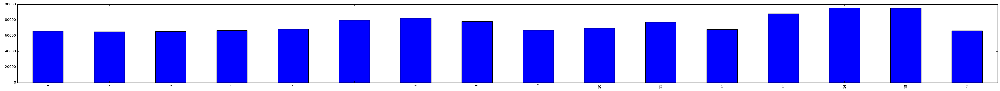

In [194]:
user_pay_1111['商家id'].plot(figsize=(50,4),kind='bar')

In [14]:
user_pay_sort_1212 = user_pay_sort['2015-12-01':'2015-12-15']

##### '2015-12-01' 到 '2015-12-15  每小时所有商家的流量情况

In [15]:
user_pay_1212 = user_pay_sort_1212.groupby(user_pay_sort_1212.index.day).count()

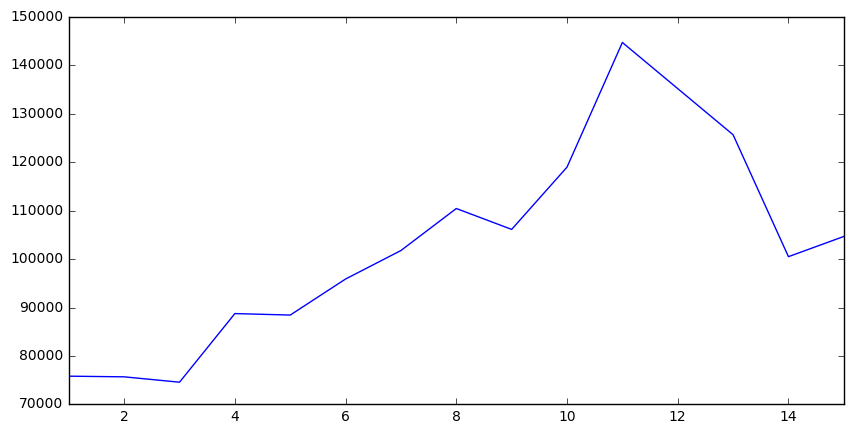

In [233]:
user_pay_1212['商家id'].plot(figsize=(10,5))

In [201]:
# help(user_pay_1212['商家id'].plot)

In [ ]:
user_pay_1212['商家id'].plot

# '2015-12-01' 到 '2015-12-15 每小时所有商家的流量情况
# 没有双十二的数据
# 思路： 将大表user_pay切割成以商家id为单位的2000张小表

In [16]:
user_pay_preparedForSplit = user_pay_sort_1212.groupby('商家id')

In [17]:
# user_pay_store_table = []
for name, group in user_pay_preparedForSplit:
#     type(group)
    group.to_csv('../tmp/' + '商家_' + str(name) + '_1212.csv')
#     print (type(name))

In [89]:
# user_pay_store_table

In [116]:
stores_1_1212 = pd.read_csv('../processed_data/' + '商家_' + str(1) + '_1212.csv')

In [142]:
stores_1_1212

,用户id,商家id
支付时间,,
2015-12-01 07:00:00,18720710,1
2015-12-01 07:00:00,6515184,1
2015-12-01 07:00:00,2928872,1
2015-12-01 07:00:00,10847475,1
2015-12-01 08:00:00,12422552,1
2015-12-01 08:00:00,10008514,1
2015-12-01 08:00:00,12906528,1
2015-12-01 08:00:00,20096551,1
2015-12-01 08:00:00,20525223,1


In [137]:
stores_1_1212.index = pd.to_datetime(stores_1_1212['支付时间'])
del stores_1_1212['支付时间']

In [150]:
stores_1_1212_count = stores_1_1212.groupby(stores_1_1212.index.day).count()

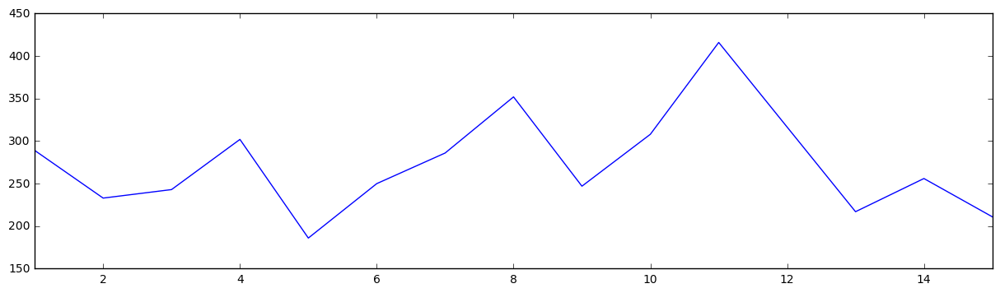

In [237]:
stores_1_1212_count['商家id'].plot(figsize=(15,4))

In [119]:
stores_2_1212 = pd.read_csv('../processed_data/' + '商家_' + str(2) + '_1212.csv')

In [18]:
user_pay_count = user_pay_sort.groupby(user_pay_sort.index.date).count()

In [ ]:
user_pay_count

# 前两幅图是user_pay_count， user_view_count 的大致走向
# 后两幅 把商家分成两种 美食类 超市类， 分别的各自走向

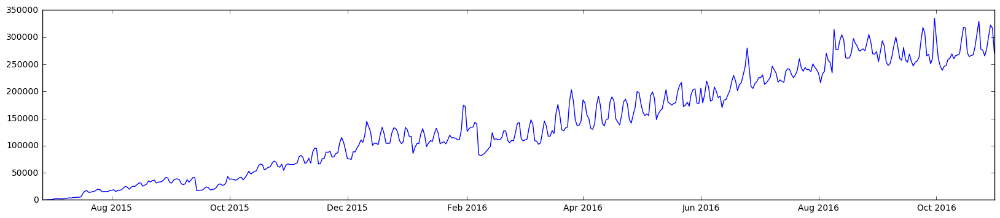

In [26]:
user_pay_count['商家id'].plot(figsize=(20,4))

In [27]:
user_view_count = user_view_sort.groupby(user_view_sort.index.date).count()

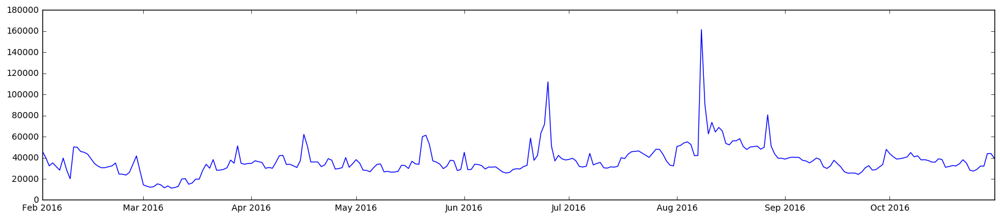

In [28]:
user_view_count['商家id'].plot(figsize=(20,4))

###  美食类商家

In [26]:
food_stores_id = shop_info_food['商家id'].unique()
print (len(food_stores_id))

1415


In [69]:
# 掩码表
food_index_boolean = []
for ele in user_pay_sort['商家id'].unique():
    if ele in food_stores_id:
        food_index_boolean.append(True)
    else:
        food_index_boolean.append(False)


In [11]:
user_pay_food_stores = user_pay_sort.loc[user_pay_sort['商家id'].isin(food_stores_id)]

NameError: name 'food_stores_id' is not defined

In [28]:
user_pay_food_stores

,用户id,商家id,支付时间
支付时间,,,
2015-06-26 06:00:00,806317,260,2015-06-26 06:00:00
2015-06-26 06:00:00,806317,260,2015-06-26 06:00:00
2015-06-26 09:00:00,17033628,560,2015-06-26 09:00:00
2015-06-26 10:00:00,2239388,1332,2015-06-26 10:00:00
2015-06-26 11:00:00,10940641,1332,2015-06-26 11:00:00
2015-06-26 11:00:00,7395775,1332,2015-06-26 11:00:00
2015-06-26 11:00:00,17247338,1332,2015-06-26 11:00:00
2015-06-26 11:00:00,21207002,1332,2015-06-26 11:00:00
2015-06-26 11:00:00,2962895,1332,2015-06-26 11:00:00


In [1]:
user_pay_food_count = user_pay_count_food_stores.groupby(user_pay_count_food_stores.index.date).count()

NameError: name 'user_pay_count_food_stores' is not defined

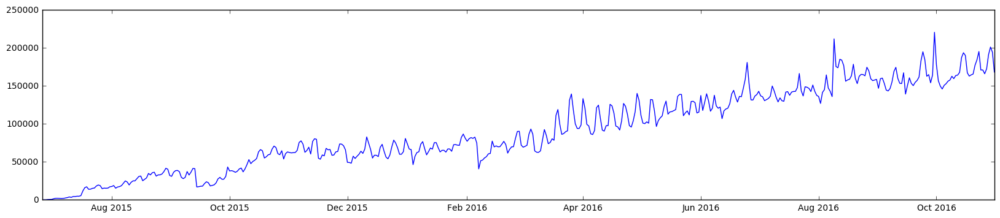

In [139]:
user_pay_food_count_fig = user_pay_food_count['count'].plot(figsize=(20,4))

###  超市类商家

In [111]:
market_stores_id = shop_info_market['商家id'].unique()

In [113]:
user_pay_count_market_stores = user_pay_sort.loc[user_pay_sort['商家id'].isin(market_stores_id)]

In [119]:
user_pay_market_count = user_pay_count_market_stores.groupby(user_pay_count_market_stores.index.date).count()

In [1]:
user_pay_market_count['count']

NameError: name 'user_pay_market_count' is not defined

# 输出上面两张图的数据

In [132]:
# 处理过后的的命令
# del user_pay_market_count['支付时间']
# del user_pay_market_count['商家id']
# user_pay_market_count.columns=['count']
user_pay_market_count.info()

<class 'pandas.core.frame.DataFrame'>
Index: 378 entries, 2015-10-19 to 2016-10-31
Data columns (total 1 columns):
count    378 non-null int64
dtypes: int64(1)
memory usage: 5.9+ KB


In [125]:
user_pay_market_count.to_csv('../dataPreProcessed/' + 'user_pay_market_count.csv')

In [137]:
fig_temp = user_pay_market_count_fig.get_figure()
fig_temp.savefig('../dataPreProcessed/' + 'user_pay_market_count.png')

In [133]:
# 处理过后的的命令
# del user_pay_food_count['支付时间']
# del user_pay_food_count['商家id']
# user_pay_food_count.columns=['count']
user_pay_food_count.info()

<class 'pandas.core.frame.DataFrame'>
Index: 493 entries, 2015-06-26 to 2016-10-31
Data columns (total 1 columns):
count    493 non-null int64
dtypes: int64(1)
memory usage: 7.7+ KB


In [134]:
user_pay_food_count.to_csv('../dataPreProcessed/' + 'user_pay_food_count.csv')

In [141]:
fig_temp = user_pay_food_count_fig.get_figure()
fig_temp.savefig('../dataPreProcessed/' + 'user_pay_food_count.png')

## 把2000商家分开了

In [33]:
for store_id_count in np.arange(1,2001,1):

    temp = user_pay[user_pay['商家id'] == store_id_count]
    
    temp.to_csv('../user_pay_2000_stores_split/' + 'user_pay_商家_' + str(store_id_count) + '.csv')


## 2000张dataFrame画在同一张图上  是没有任何作用的
## 应该对商家进行分类后在画在同一张图上
## 怎么分类：
        # location_id 001 ,所在位置编号，位置接近的商家具有相同的编号
        # per_pay 3 ,人均消费（数值越大消费越高）
        # score 1 ,评分（数值越大评分越高）
        # comment_cnt 2 ,评论数（数值越大评论数越多）
        # shop_level 1 ,门店等级（数值越大门店等级越高）

In [7]:
from os import listdir
from os.path import isfile, join
mypath = '/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_2000_stores_split'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
onlyfiles.remove('.DS_Store')

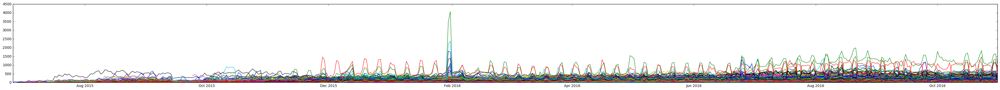

In [57]:
for file_name in onlyfiles[:500]:
#     print (file_name)
    temp = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_2000_stores_split/' + file_name)
    temp.index = pd.to_datetime(temp['支付时间'])
    temp_count = temp.groupby(temp.index.date).count()
    temp_count['商家id'].plot(figsize=(50,4))

## 上图感想：
    1.好像有几个商店会有类似的流量走向，会在某段时间变高
    2.大部分店家的走势有能会相同《= 凭空想象
    3.还是要对商家分类后分别画图才会知道

## 利用weka找出商家属性和商家流量之间的关系

In [73]:
temp_1 = user_pay_food_stores.groupby('商家id')

In [75]:
user_pay_food_store = []
for name, group in temp_1:
    (group)
#     group.to_csv('../processed_data/' + '商家_' + str(name) + '_1212.csv')
#     print (name)

                         用户id  商家id                 支付时间
支付时间                                                    
2015-10-10 15:00:00   6571864     1  2015-10-10 15:00:00
2015-10-10 15:00:00  17414911     1  2015-10-10 15:00:00
2015-10-10 15:00:00  16491475     1  2015-10-10 15:00:00
2015-10-10 15:00:00   6051831     1  2015-10-10 15:00:00
2015-10-10 15:00:00  17011985     1  2015-10-10 15:00:00
2015-10-10 15:00:00   2428632     1  2015-10-10 15:00:00
2015-10-10 15:00:00   2428632     1  2015-10-10 15:00:00
2015-10-10 15:00:00   8268212     1  2015-10-10 15:00:00
2015-10-10 15:00:00   1519889     1  2015-10-10 15:00:00
2015-10-10 15:00:00   8268212     1  2015-10-10 15:00:00
2015-10-10 15:00:00  12272656     1  2015-10-10 15:00:00
2015-10-10 15:00:00  12272656     1  2015-10-10 15:00:00
2015-10-10 15:00:00   8665120     1  2015-10-10 15:00:00
2015-10-10 15:00:00  13431834     1  2015-10-10 15:00:00
2015-10-10 16:00:00  19214169     1  2015-10-10 16:00:00
2015-10-10 16:00:00  15075348  

In [ ]:
user_pay_with_attributes

In [34]:
user_pay_food_stores.sort('商家id')
# del user_pay_food_stores['支付时间']

/Users/wiwi/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


,用户id,商家id
支付时间,,
2016-06-02 15:00:00,6443695,1
2016-10-18 20:00:00,15324748,1
2015-10-18 10:00:00,14623665,1
2016-01-26 21:00:00,14538752,1
2016-02-14 08:00:00,17497220,1
2016-10-18 20:00:00,21580524,1
2016-02-14 08:00:00,6369823,1
2016-10-05 12:00:00,4570808,1
2015-10-18 10:00:00,356091,1


In [11]:

for file_name in onlyfiles:
    temp = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_2000_stores_split/' + file_name)
#     temp_store_id = temp['商家id'][0]
#     index 就是temp_store_id

    temp.index = pd.to_datetime(temp['支付时间'])
    
    temp_1 = temp.groupby(temp.index.date).count()
    index = int(file_name.split('_')[3].split('.')[0]) - 1
    temp_1['市名'] = [shop_info['市名'][index]] * len(temp_1.index)
    temp_1['位置编号'] = [shop_info['位置编号'][index]] * len(temp_1.index)
    temp_1['人均消费'] = [shop_info['人均消费'][index]] * len(temp_1.index)
    temp_1['评分'] = [shop_info['评分'][index]] * len(temp_1.index)
    temp_1['评论数'] = [shop_info['评论数'][index]] * len(temp_1.index)
    temp_1['门店等级'] = [shop_info['门店等级'][index]] * len(temp_1.index)
    temp_1['一级品类名称'] = [shop_info['一级品类名称'][index]] * len(temp_1.index)
    temp_1['二级分类名称'] = [shop_info['二级分类名称'][index]] * len(temp_1.index)
    temp_1['三级分类名称'] = [shop_info['三级分类名称'][index]] * len(temp_1.index)
    del temp_1['商家id']
    del temp_1['用户id']
    del temp_1['支付时间']
#     temp_1.drop([temp_1.columns[0]], axis = 1)
    temp_1['商家id'] = [index + 1] * len(temp_1.index)
    temp_1.columns.values[0] = '流量'
    
    temp_1.to_csv('../user_pay_countbyday_with_attributes_2000_stores_split/' + str(index + 1) + '.csv')

#     dataSet_v1.append(temp_1)

#     市名	位置编号	人均消费	评分	评论数	门店等级	一级品类名称	二级分类名称	三级分类名称


In [99]:
dataSet_v1 = pd.DataFrame()

In [15]:
from os import listdir
from os.path import isfile, join
mypath = '/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_countbyday_with_attributes_2000_stores_split'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
onlyfiles.remove('.DS_Store')

In [120]:
data_list = []
for file_name in onlyfiles:
    temp = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_countbyday_with_attributes_2000_stores_split/' + file_name,
                      )
#     dataSet_v1 = dataSet_v1.append(temp)
    data_list.append(temp)
    
# dataSet_v1 = pd.concat(data_list, axis=1)


In [121]:
dataSet_v1 = pd.concat(data_list, ignore_index=False)

In [122]:
dataSet_v1.to_csv('../dataPreProcessed/'+'user_pay_countbyday.csv')

In [44]:
# temp = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_countbyday_with_attributes_2000_stores_split/' + 'user_pay_countbyday_商家_4.csv',
#                    index_col = 0, parse_dates=True)

In [126]:
dataSet_v1.to_csv('../dataPreProcessed/'+'user_pay_countbyday.csv')

In [127]:
dataSet_v1

,Unnamed: 0,流量,市名,位置编号,人均消费,评分,评论数,门店等级,一级品类名称,二级分类名称,三级分类名称,商家id
0,2015-10-10,188,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
1,2015-10-11,272,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
2,2015-10-12,257,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
3,2015-10-13,239,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
4,2015-10-14,277,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
5,2015-10-15,227,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
6,2015-10-16,242,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
7,2015-10-17,293,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
8,2015-10-18,291,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1
9,2015-10-19,256,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,1


In [45]:
result['商家id'].unique()

array([  1,  10, 100, ..., 997, 998, 999])

In [92]:
# temp_totp = user_pay_food_stores.groupby(user_pay_food_stores.index.date).count()

In [22]:
'user_pay_商家_1123.csv'.split('_')[3].split('.')[0]

'1123'

In [23]:
[shop_info['市名'][1]] * len([123,123])

NameError: name 'shop_info' is not defined

In [68]:
we1 = pd.DataFrame({'123':'123','sd':'s' },index = [1,2])

In [69]:
we1['123'] = [shop_info['市名'][1]] * len([123,123])

In [70]:
# we1.drop([we1.columns[0]], axis = 1)

In [71]:
we1.columns.values[0] = '123'

In [100]:
result = dataSet_v1.append([temp, temp123123], ignore_index=True)

In [84]:
# temp123123 = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_countbyday_with_attributes_2000_stores_split/' + 'user_pay_countbyday_商家_1111.csv')

In [85]:
# temp = pd.read_csv('/Users/wiwi/Desktop/IJCAI-17 口碑商家客流量预测/user_pay_countbyday_with_attributes_2000_stores_split/' + 'user_pay_countbyday_商家_1223.csv')

In [102]:
# result

In [95]:
# temp.info()
347+165

512

In [124]:
temp123123.index = pd.to_datetime(temp123123['支付时间'])

In [125]:
index = file_name.split('_')[3].split('.')[0]

In [126]:
temp123123.groupby(temp123123.index.date).count()

,Unnamed: 0,用户id,商家id,支付时间
2015-10-10,12,12,12,12
2015-10-11,14,14,14,14
2015-10-12,45,45,45,45
2015-10-13,50,50,50,50
2015-10-14,85,85,85,85
2015-10-15,69,69,69,69
2015-10-16,90,90,90,90
2015-10-17,28,28,28,28
2015-10-18,29,29,29,29
2015-10-19,117,117,117,117


In [26]:
asdf = user_pay_sort[user_pay_sort['商家id']==1]

In [27]:
asdf.resample('H').groupby(asdf.index.date).count()

TypeError: 'TimeGrouper' object is not callable

In [ ]:
user_pay_sort[user_pay_sort['商家id']==1].resample('H').fillna